## Objectives

In this case my objectives would be:  
1. Preparing the data (Computer Vision) that would be used to train the Machine Learning Model
2. Creating Artificial Neural Network to build Machine Learning Model that could recognize the Forest Fire
3. Improve the model
4. Create an app based on this model

## Data

The dataset that will be used to train this model was obtained from [Kaggle: Forest Fire Bigdata](https://www.kaggle.com/datasets/mohammedborhanuddin/forest-fire-bigdata). This dataset contains a total of 1.832 photos, with 928 photos of `fire_images` and 904 photos of `non_fire_images`. Both of these images categories would be augmented and later would be splitted into train, val, and test sets.

# Import Libraries

> This section will be used to import libraries needed in this Machine Learning Model

In [1]:
# Import libraries
import os
import cv2
import glob
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import requests
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


# Data Loading

The dataset has been loaded to this google colab, but in order to makes it easier for us in the process, it's better to rename the files based on their label (fire and nofire)

In [ ]:
# Renaming files
fire_file = glob.glob('Forest_Fire_BigData/fire_images/*')
n = 1
for fr in fire_file:
  os.rename(fr, 'Forest_Fire_BigData/fire_images/fire_'+ "{:03d}".format(n) +'.jpg')
  n += 1

non_fire_file = glob.glob('Forest_Fire_BigData/non_fire_images/*')
for nf in non_fire_file:
  os.rename(nf, 'Forest_Fire_BigData/non_fire_images/nofire_' + "{:03d}".format(n) +'.jpg')
  n += 1

# Listing images of each category
fire_file = glob.glob('Forest_Fire_BigData/fire_images/*')
non_fire_file = glob.glob('Forest_Fire_BigData/non_fire_images/*')

fire_file.sort()
non_fire_file.sort()

print('fire_file : ', fire_file)
print('')
print('non_fire_file : ', non_fire_file)

fire_file :  ['Forest_Fire_BigData/fire_images\\fire_001.jpg', 'Forest_Fire_BigData/fire_images\\fire_002.jpg', 'Forest_Fire_BigData/fire_images\\fire_003.jpg', 'Forest_Fire_BigData/fire_images\\fire_004.jpg', 'Forest_Fire_BigData/fire_images\\fire_005.jpg', 'Forest_Fire_BigData/fire_images\\fire_006.jpg', 'Forest_Fire_BigData/fire_images\\fire_007.jpg', 'Forest_Fire_BigData/fire_images\\fire_008.jpg', 'Forest_Fire_BigData/fire_images\\fire_009.jpg', 'Forest_Fire_BigData/fire_images\\fire_010.jpg', 'Forest_Fire_BigData/fire_images\\fire_011.jpg', 'Forest_Fire_BigData/fire_images\\fire_012.jpg', 'Forest_Fire_BigData/fire_images\\fire_013.jpg', 'Forest_Fire_BigData/fire_images\\fire_014.jpg', 'Forest_Fire_BigData/fire_images\\fire_015.jpg', 'Forest_Fire_BigData/fire_images\\fire_016.jpg', 'Forest_Fire_BigData/fire_images\\fire_017.jpg', 'Forest_Fire_BigData/fire_images\\fire_018.jpg', 'Forest_Fire_BigData/fire_images\\fire_019.jpg', 'Forest_Fire_BigData/fire_images\\fire_020.jpg', 'Fores

Now the data have proper names, we'll make a DataFrame of the Data to ease further process

In [3]:
# Create a Pandas DataFrame that contains the path of all images

all_files = fire_file + non_fire_file
labels = ['fire' for i in range(len(fire_file))] + ['nofire' for i in range(len(non_fire_file))]
df_img = pd.DataFrame({'images':all_files, 'label':labels})
df_img = df_img.sample(len(df_img)).reset_index(drop=True)
df_img

,images,label
0,Forest_Fire_BigData/fire_images\fire_318.jpg,fire
1,Forest_Fire_BigData/fire_images\fire_119.jpg,fire
2,Forest_Fire_BigData/non_fire_images\nofire_175...,nofire
3,Forest_Fire_BigData/fire_images\fire_367.jpg,fire
4,Forest_Fire_BigData/non_fire_images\nofire_113...,nofire
...,...,...
1827,Forest_Fire_BigData/fire_images\fire_162.jpg,fire
1828,Forest_Fire_BigData/fire_images\fire_379.jpg,fire
1829,Forest_Fire_BigData/fire_images\fire_826.jpg,fire
1830,Forest_Fire_BigData/fire_images\fire_302.jpg,fire


In [4]:
# Unique Category
categories = df_img['label'].unique()

# Index Category
class_indices = {category: index for index, category in enumerate(categories)}

# Show Category
print('Index of categories:', class_indices)

Index of categories: {'fire': 0, 'nofire': 1}


# Exploratory Data Analysis

In [5]:
# Creating Path
fire_images = "D:/4. Projects/ForestFirePredict/Forest_Fire_BigData/fire_images/"
non_fire_images = "D:/4. Projects/ForestFirePredict/Forest_Fire_BigData/non_fire_images/"

## First Glance of the data

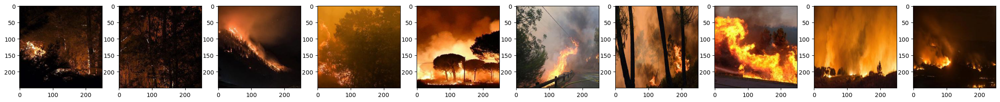

In [6]:
# Show fire images
fig, ax = plt.subplots(ncols=10, figsize=(30,3))
for i in range(10):
  fire = plt.imread(fire_file[i])
  ax[i].imshow(fire)

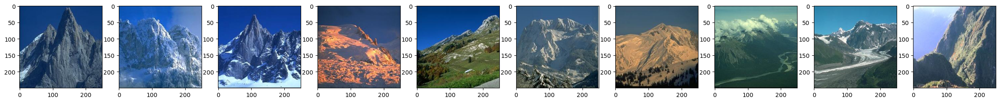

In [7]:
# Show non_fire images
fig, ax = plt.subplots(ncols=10, figsize=(30,3))
for i in range(10):
  nofire = plt.imread(non_fire_file[i])
  ax[i].imshow(nofire)

Looking at these 1o pictures of each files, we could see that on `fire images`, every picture contains (and most of them are dominated by) **red-orange** color from the fire, and the rest of the pic is generally **darker** making the **details are less visible** since the light from the fire acts as backlight and disturbs the ability of the camera to pick up light reflection from other objects.

While on the `non fire images`, the color varies more (most of them are dominated by **green**) and pictures are overally **brighter** and have more **visible details**

## Showing Random Images

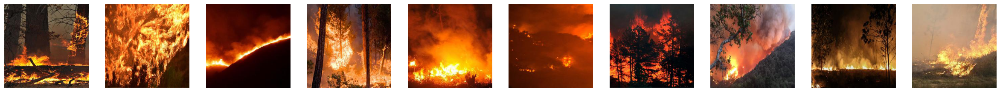

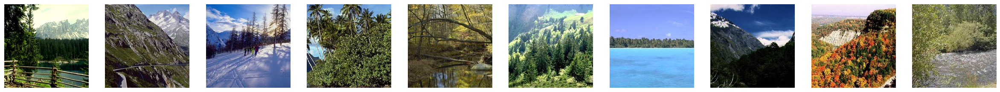

In [8]:
# Function to display random images
def show_random_images(image_files, num_images=10):
  fig, ax = plt.subplots(ncols=num_images, figsize=(30,3))
  random.seed(27)
  random_indices = random.sample(range(len(image_files)), num_images)
  for i, idx in enumerate(random_indices):
    image = plt.imread(image_files[idx])
    ax[i].imshow(image)
    ax[i].axis('off') # hide axis ticks and labels

  plt.show()

# Show random fire images
show_random_images(fire_file)

# Show random non-fire images
show_random_images(non_fire_file)

This section was made so I could further check the data by random sample. And now we could see that some `fire images` only shows a little of **orange color** indicating the fire is still small and I hope this data could also help the model to learn about small fires since this model was meant to be built as an early warning system. There's also a picture that shows **huge forest fire** that makes the image **brigther** and distorted the color to **gold-ish**

While on the `non fire images` we could see that some picture contains scene that has **darker** shades and **pink-red** flowers. These images could help the model to learn that not all **red color** means fire.

So far, I think what could differ two labels are **color** (red-orange domination vs green domination), **brightness** (darker images vs brighter images), and details **visibility** (not visible vs visible).

## Data Composition

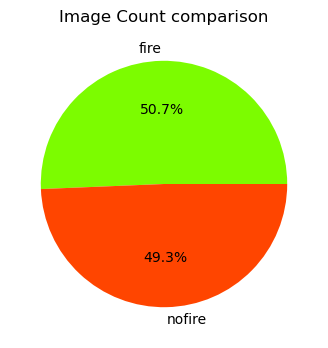

In [9]:
# Pie Chart of Label composition
label_counts = df_img['label'].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%',  colors=['lawngreen', 'orangered'])
plt.title('Image Count comparison')
plt.show()

This piechart shows that the data we have are not really balanced, with nofire data has higher counts than the fire data. This would later be a part of consideration in image augmentation

## Data sizes

### Fire Images data size

In [10]:
image_dimensions = []

for filename in os.listdir(fire_images):
    if filename.endswith(".jpg"):
        img = Image.open(os.path.join(fire_images, filename))
        width, height = img.size
        image_dimensions.append((width, height))

dimensions_array = np.array(image_dimensions)

# Get statistics
mean_width = np.mean(dimensions_array[:, 0])
mean_height = np.mean(dimensions_array[:, 1])
min_width = np.min(dimensions_array[:, 0])
max_width = np.max(dimensions_array[:, 0])
min_height = np.min(dimensions_array[:, 1])
max_height = np.max(dimensions_array[:, 1])

print("Mean Width:", mean_width)
print("Min Width:", min_width)
print("Max Width:", max_width)
print("Mean Height:", mean_height)
print("Min Height:", min_height)
print("Max Height:", max_height)

Mean Width: 250.0
Min Width: 250
Max Width: 250
Mean Height: 250.0
Min Height: 250
Max Height: 250


### Non Fire Images data size

In [11]:
image_dimensions = []

for filename in os.listdir(non_fire_images):
    if filename.endswith(".jpg"):
        img = Image.open(os.path.join(non_fire_images, filename))
        width, height = img.size
        image_dimensions.append((width, height))

dimensions_array = np.array(image_dimensions)

# Get statistics
mean_width = np.mean(dimensions_array[:, 0])
mean_height = np.mean(dimensions_array[:, 1])
min_width = np.min(dimensions_array[:, 0])
max_width = np.max(dimensions_array[:, 0])
min_height = np.min(dimensions_array[:, 1])
max_height = np.max(dimensions_array[:, 1])

print("Mean Width:", mean_width)
print("Min Width:", min_width)
print("Max Width:", max_width)
print("Mean Height:", mean_height)
print("Min Height:", min_height)
print("Max Height:", max_height)

Mean Width: 250.0
Min Width: 250
Max Width: 250
Mean Height: 250.0
Min Height: 250
Max Height: 250


### Data Size Conclusion

We could see that both `Fire Images` and `Non Fire Images` contains data with similar sizing, which means we don't have to change it's sizing in Feature Engineering

## Color Analysis

In [12]:
# Lists to store mean RGB values for each class
fire_rgb_means = []
non_fire_rgb_means = []

# Function to calculate mean RGB for an image
def calculate_mean_rgb(image_path):
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(img)
    mean_rgb = img_np.mean(axis=(0, 1))
    return mean_rgb

# Process forest fire images
for filename in os.listdir(fire_images):
    if filename.endswith(".jpg"):
        mean_rgb = calculate_mean_rgb(os.path.join(fire_images, filename))
        fire_rgb_means.append(mean_rgb)

# Process non-fire images
for filename in os.listdir(non_fire_images):
    if filename.endswith(".jpg"):
        mean_rgb = calculate_mean_rgb(os.path.join(non_fire_images, filename))
        non_fire_rgb_means.append(mean_rgb)

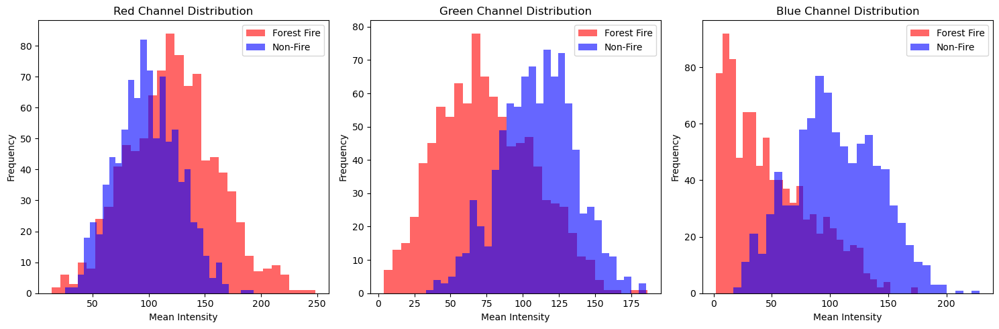

In [13]:
fire_rgb_means = np.array(fire_rgb_means)
non_fire_rgb_means = np.array(non_fire_rgb_means)

# Plot histograms for each RGB channel
colors = ['Red', 'Green', 'Blue']
plt.figure(figsize=(15, 5))

for i, color in enumerate(colors):
    plt.subplot(1, 3, i+1)
    plt.hist(fire_rgb_means[:, i], bins=30, alpha=0.6, color='red', label="Forest Fire")
    plt.hist(non_fire_rgb_means[:, i], bins=30, alpha=0.6, color='blue', label="Non-Fire")
    plt.title(f"{color} Channel Distribution")
    plt.xlabel("Mean Intensity")
    plt.ylabel("Frequency")
    plt.legend()

plt.tight_layout()
plt.show()

If we see the three graph above, red three graph above we may find that the **Red Channel** of `fire images` and `non fire images` are actually overlapping. The red Channel, of `Fire images` are generally higher, this might be caused by the **red-orange** color from the fire

On the other hand, the **Green Channel** Distribution favors the `non fire images` since non fire images are mainly dominated by green. But we could still see that some of the picture from `fire images` are still having high intensity **green color** as well.


 While if we see the **Blue Channel** Distribution Graph, we could find that `non fire images` has generally higher intensity in **Blue**. This migh happen because when There's fire, the camera would struglle to capture the color of the sky since the fire would usually be the brighter light source. Plus, the color of Fire is warm (red-orange) and contradicts cold color like blue.

# Feature Engineering

## Data Splitting

In [14]:
# Split the data into training, validation, and testing sets
train, temp_df = train_test_split(df_img, test_size=0.3, random_state=27)
val, test = train_test_split(temp_df, test_size=0.5, random_state=27)

# Checking the Image counts on each set
print("Train Set:")
print(train['label'].value_counts())
print("\nValidation Set:")
print(val['label'].value_counts())
print("\nTest Set:")
print(test['label'].value_counts())

Train Set:
label
fire      660
nofire    622
Name: count, dtype: int64

Validation Set:
label
fire      143
nofire    132
Name: count, dtype: int64

Test Set:
label
nofire    150
fire      125
Name: count, dtype: int64


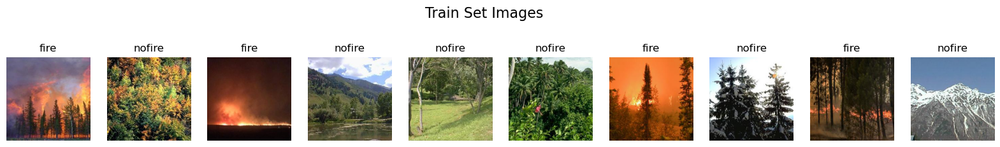

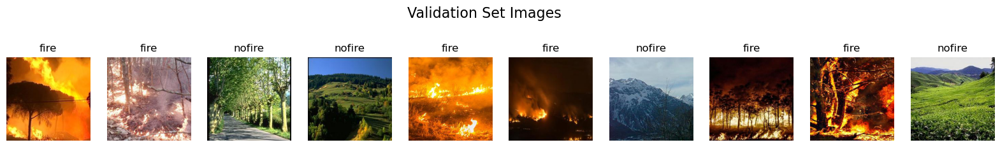

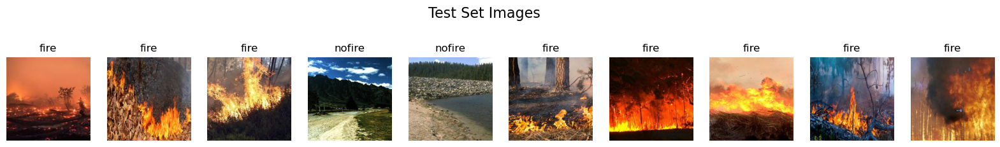

In [15]:
def show_images_with_labels(df, set_name, num_images=10):
  random.seed(27)
  random_indices = random.sample(range(len(df)), num_images)
  fig, axes = plt.subplots(1, num_images, figsize=(20, 3))
  fig.suptitle(f"{set_name} Set Images", fontsize=16)

  for i, idx in enumerate(random_indices):
      image_path = df['images'].iloc[idx]
      label = df['label'].iloc[idx]
      img = plt.imread(image_path)
      axes[i].imshow(img)
      axes[i].set_title(label)
      axes[i].axis('off')
  plt.show()

# Display images from each set
show_images_with_labels(train, "Train")
show_images_with_labels(val, "Validation")
show_images_with_labels(test, "Test")


## Data Preprocessing

In [16]:
# Parameters
img_height = 250
img_width = 250
batch_size = 92

In [17]:
# Create batch generator for train-set, val-set, and test-set

train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(
                                                                      rescale=1./255,
                                                                      rotation_range=15,                                                                                
                                                                      zoom_range=0.2,
                                                                      width_shift_range=0.1,
                                                                      height_shift_range=0.1,
                                                                      shear_range=0.1,
                                                                      horizontal_flip=True,
                                                                      fill_mode='nearest',
                                                                   )

train_aug = train_datagen_aug.flow_from_dataframe(
                                                      dataframe=train,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=27
                                                     )

val_aug = train_datagen_aug.flow_from_dataframe(
                                                      dataframe=val,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=27
                                                     )

test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

test_aug = test_datagen_aug.flow_from_dataframe(
                                                      dataframe=test,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=False,
                                                      seed=27
                                                   )

Found 1282 validated image filenames belonging to 2 classes.
Found 275 validated image filenames belonging to 2 classes.
Found 275 validated image filenames belonging to 2 classes.


# ANN Training (Initiate)

## Model Definition

In [18]:
# Clear session
tf.compat.v1.reset_default_graph()

# Set seed
np.random.seed(27)
tf.random.set_seed(27)

# Create Sequential API model
model = Sequential()
model.add(Conv2D(16, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(32, (3,3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3,3),activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3,3),activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu')) 
model.add(Dense(1, activation='sigmoid'))

# Compile
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 248, 248, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 124, 124, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 122, 122, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 61, 61, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 59, 59, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 27, 27, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 13, 13, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 130,721 (510.63 KB)

 Trainable params: 130,721 (510.63 KB)

 Non-trainable params: 0 (0.00 B)

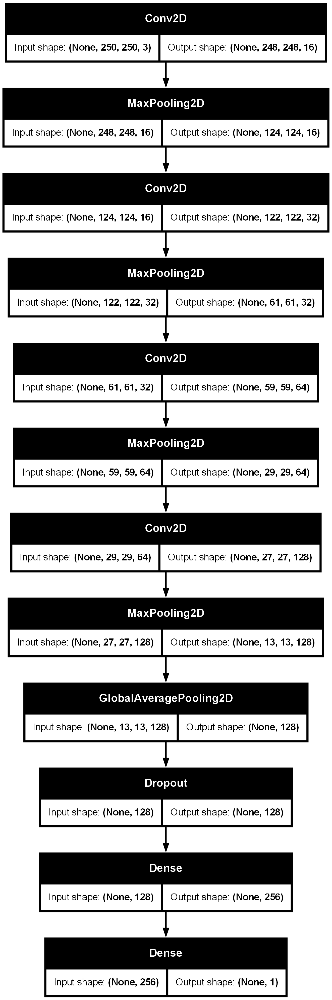

In [19]:
# Plot layers
tf.keras.utils.plot_model(model, show_shapes=True)

## Model Training

In [20]:
# Train the model

history_mod = model.fit(train_aug, epochs=20, validation_data=val_aug, batch_size=batch_size)

Epoch 1/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.7464 - loss: 0.6080 - val_accuracy: 0.8436 - val_loss: 0.3470
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.8584 - loss: 0.3331 - val_accuracy: 0.9164 - val_loss: 0.2320
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9125 - loss: 0.2434 - val_accuracy: 0.9455 - val_loss: 0.1659
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9299 - loss: 0.2265 - val_accuracy: 0.9127 - val_loss: 0.2027
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9346 - loss: 0.1807 - val_accuracy: 0.9455 - val_loss: 0.1322
Epoch 6/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9438 - loss: 0.1581 - val_accuracy: 0.9564 - val_loss: 0.1299
Epoch 7/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9505 - loss: 0.1535 - val_accuracy: 0.9600 - val_loss: 0.1262
Epoch 8/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9589 - loss: 0.1448 - val_accuracy: 0.9418 - val_loss:

## Model Evaluation

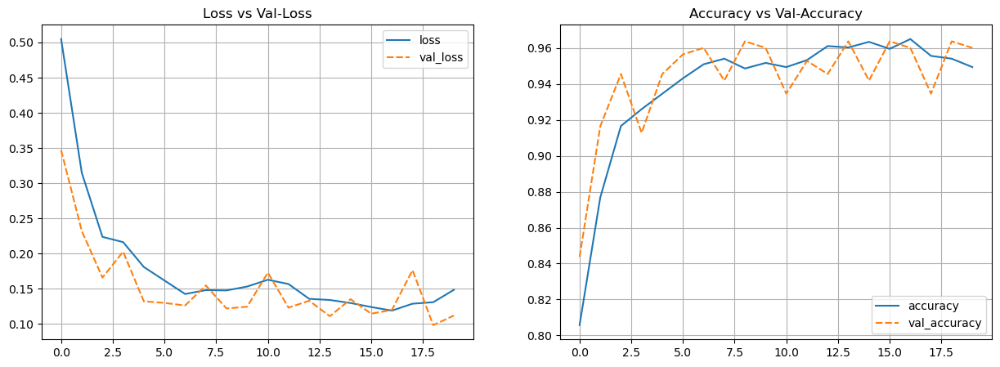

In [21]:
# Plot training results

history_mod_df = pd.DataFrame(history_mod.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_mod_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_mod_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [22]:
# Classification Report
y_pred_prob = model.predict(test_aug)
y_pred_classes = (y_pred_prob > 0.71).astype("int32")

y_test = test_aug.classes

class_names= list(class_indices.keys())
print(classification_report(y_test, y_pred_classes, target_names=class_names))

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 311ms/step
              precision    recall  f1-score   support

        fire       0.98      0.97      0.98       125
      nofire       0.97      0.99      0.98       150

    accuracy                           0.98       275
   macro avg       0.98      0.98      0.98       275
weighted avg       0.98      0.98      0.98       275



From the graph above, this initial Model looks good already. But we can see at some point on both Loss and Accuracy has high fluctuation. We might try to reduce it to a smoother progress of learning. Also looking at the classification reprot it has accuracy of 97%. Which makes this model good enough

# ANN Improvement

## Model Definition

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 248, 248, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 124, 124, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 122, 122, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 61, 61, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 59, 59, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 53824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 53824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     6,889,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,913,313 (26.37 MB)

 Trainable params: 6,913,313 (26.37 MB)

 Non-trainable params: 0 (0.00 B)

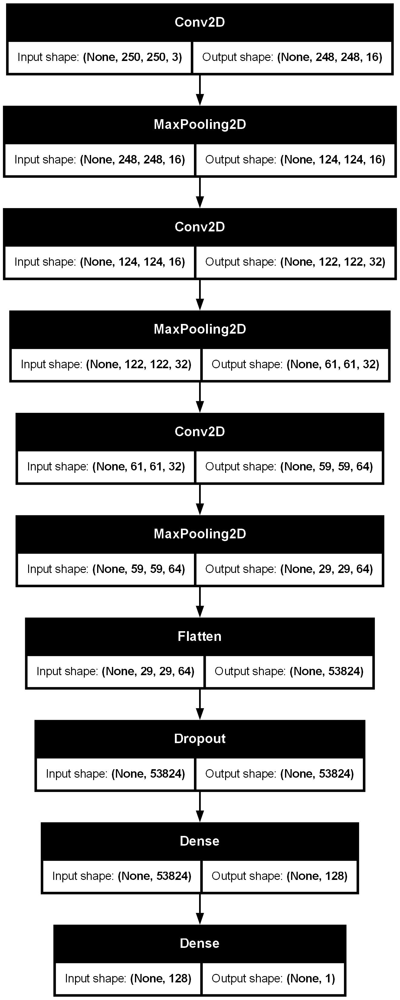

In [23]:
# Clear Session
tf.keras.backend.clear_session()
np.random.seed(27)
tf.random.set_seed(27)

# Creating Model Improvement
model_imp = Sequential()
model_imp.add(Conv2D(16, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model_imp.add(MaxPooling2D(2, 2))
model_imp.add(Conv2D(32, (3,3), activation='relu'))
model_imp.add(MaxPooling2D(2, 2))
model_imp.add(Conv2D(64, (3,3),activation='relu')) #reducing layer
model_imp.add(MaxPooling2D(2, 2))
model_imp.add(Flatten()) # Changing GAP to flatten
model_imp.add(Dropout(0.5)) # Increasing Dropout Rate
model_imp.add(Dense(128, activation='relu')) 
model_imp.add(Dense(1, activation='sigmoid'))

# Compile
model_imp.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True) # Adding Early Stop
model_imp.summary()

# Plot the improved model
tf.keras.utils.plot_model(model_imp, show_shapes=True)


## Model Training

In [24]:

history_mod_improve = model_imp.fit(train_aug, epochs=30, validation_data=val_aug, batch_size=batch_size, callbacks=[early_stop])

Epoch 1/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.5965 - loss: 0.9690 - val_accuracy: 0.8764 - val_loss: 0.3432
Epoch 2/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.9025 - loss: 0.2647 - val_accuracy: 0.9200 - val_loss: 0.1972
Epoch 3/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.9443 - loss: 0.1821 - val_accuracy: 0.9527 - val_loss: 0.1668
Epoch 4/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9533 - loss: 0.1553 - val_accuracy: 0.9491 - val_loss: 0.1322
Epoch 5/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9462 - loss: 0.1504 - val_accuracy: 0.9455 - val_loss: 0.1364
Epoch 6/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.9546 - loss: 0.1280 - val_accuracy: 0.9600 - val_loss: 0.1313
Epoch 7/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9512 - loss: 0.1576 - val_accuracy: 0.9564 - val_loss: 0.1312
Epoch 8/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9557 - loss: 0.1146 - val_accuracy: 0.9527 - val_loss:

## Model Evaluation

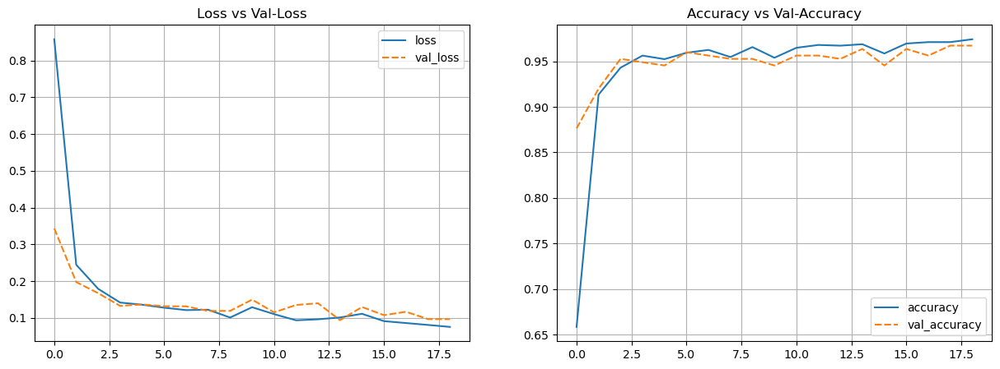

In [25]:
# Plot training results

history_imp_df = pd.DataFrame(history_mod_improve.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_imp_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_imp_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [26]:
# Classification Report
y_pred_prob = model_imp.predict(test_aug)
y_pred_classes = (y_pred_prob > 0.71).astype("int32")

y_test = test_aug.classes

class_names= list(class_indices.keys())
print(classification_report(y_test, y_pred_classes, target_names=class_names))

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 540ms/step
              precision    recall  f1-score   support

        fire       0.97      0.96      0.96       125
      nofire       0.97      0.97      0.97       150

    accuracy                           0.97       275
   macro avg       0.97      0.97      0.97       275
weighted avg       0.97      0.97      0.97       275



From the Graph and The Classification Report, we could see an improvement from the first model. While the fluctuation of Loss and Accuracy still happens, the end-result and the accuracy of this model gets better.

# Model Saving

In [27]:
model_imp.save('model_imp.keras')

# Inferrencing

## Defining the Function

In [28]:
# Define the prediction function
def forestfire_pred(file):
    img = tf.keras.utils.load_img(file, target_size=(img_height, img_width))

    # Apply preprocessing
    x = tf.keras.utils.img_to_array(img)/255.0
    # Expand dimensions to match the input shape (1, img_height, img_width, 3)
    x = np.expand_dims(x, axis=0)

    # Predict probability
    prediction = model_imp.predict(x)
    label = 'nofire' if prediction[0] > 0.71 else 'fire'

    # Determine the class based on threshold (0.5 for binary classification)

    # Display image and prediction
    plt.imshow(tf.keras.utils.load_img(file))
    plt.axis('off')
    plt.title(f'Prediction: {label}')
    plt.show()

    print('Prediction : {}'.format(label))
    print(f"Raw prediction: {prediction[0]}")

# Automating the Inference
def predict_link(link):
    response = requests.get(link)
    with open("inf.jpg", 'wb') as file:
        file.write(response.content)
    
    forestfire_pred("inf.jpg")

## Testing the Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


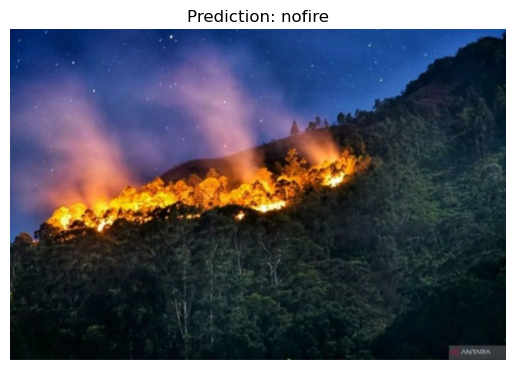

Prediction : nofire
Raw prediction: [0.967932]


In [29]:
predict_link('https://cdn.antaranews.com/cache/1200x800/2024/07/22/WhatsApp-Image-2024-07-22-at-19.38.56.jpeg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


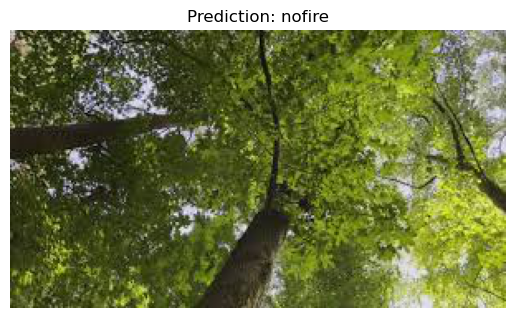

Prediction : nofire
Raw prediction: [0.9999989]


In [30]:
predict_link('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRzOfmuH44cS4jfcCAnGIYrF9u7eNXT7msBiw&s')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


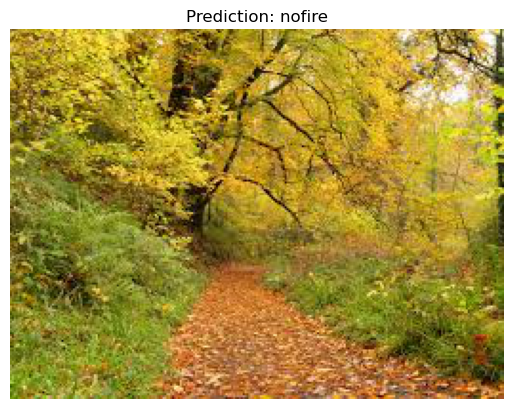

Prediction : nofire
Raw prediction: [0.99949265]


In [31]:
predict_link('https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcS7Hk0PohyrHvPnQodxrj7d9-QvuAeQ-rJjtw&s')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


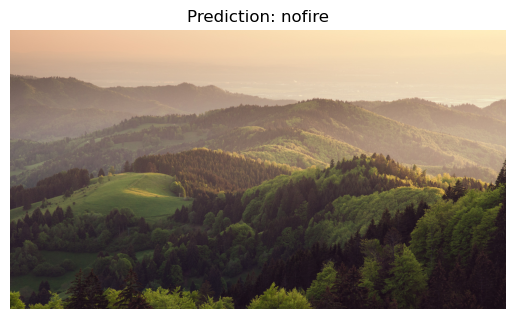

Prediction : nofire
Raw prediction: [0.9460488]


In [32]:
predict_link('https://media.cntraveler.com/photos/5eb18e42fc043ed5d9779733/16:9/w_4288,h_2412,c_limit/BlackForest-Germany-GettyImages-147180370.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


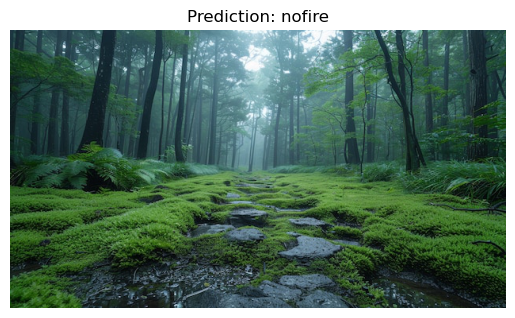

Prediction : nofire
Raw prediction: [0.99999845]


In [33]:
predict_link('https://img.freepik.com/free-photo/beautiful-japanese-forest-landscape_23-2151498032.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


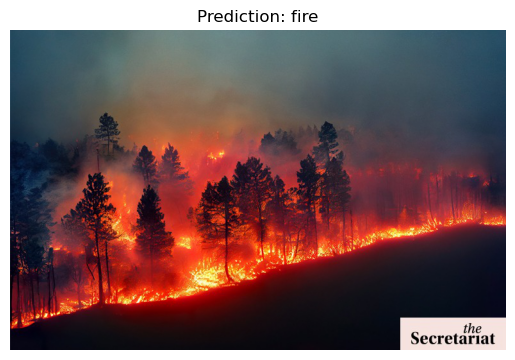

Prediction : fire
Raw prediction: [0.00040669]


In [34]:
predict_link('https://api.thesecretariat.in/the-secretariat-api/public//file/download-content-attachment?fileId=38bcb4954612476599081c4a2b8074f6')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


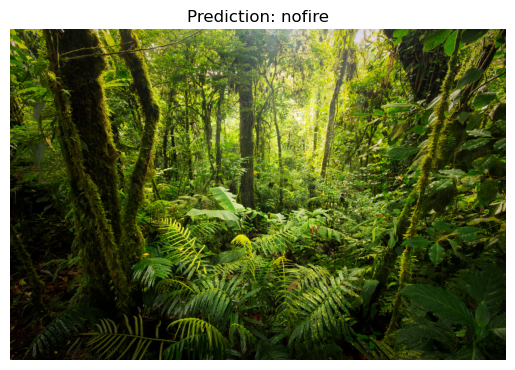

Prediction : nofire
Raw prediction: [1.]


In [35]:
predict_link('https://wallpapers.com/images/featured/forest-pictures-ghluxfda78g0i0ap.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


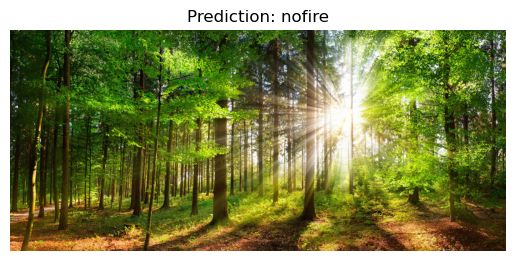

Prediction : nofire
Raw prediction: [0.99999887]


In [36]:
predict_link('https://t4.ftcdn.net/jpg/02/55/17/43/360_F_255174366_ojDuATz84e5h7lIlxh2moUJa9Kpd5wKk.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


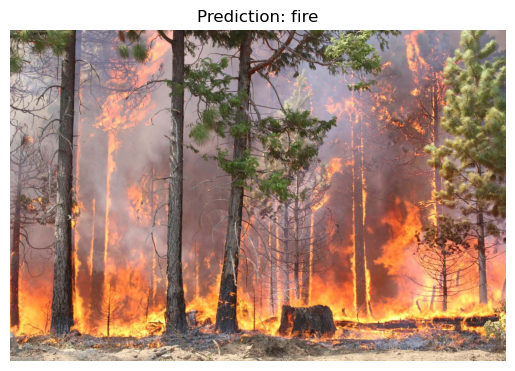

Prediction : fire
Raw prediction: [0.29910707]


In [37]:
predict_link('https://cdn.britannica.com/42/188142-050-4D4D9D19/wildfire-Stanislaus-National-Forest-California-2013.jpg')

# Conclusion

This Machine Learning Model achieve high accuracy rating, and could differ `Fire Images` and `Non Fire Images` on most cases.   
While this Model has high accuracy, I still found out some weaknesses:
- This Model Predicting pictures using RGB color space, which means the dominancy of fire (color **red-orange**) is the defining factor.
- The Color **Green** is also important to detect the fire.
- The model can misinterpret small fire as `no fire images`
- This model also misinterpret **amber-red** colored leaves as `fire images`

I think it's better to apply HSV color space conversion to train this model since we could also see the differences of stats is more visible in HSV rather than in RGB,  
I've tried to apply the HSV conversion but my lack of skills forced me to creat this model using RGB instead.